In [2]:
%matplotlib inline

from collections import defaultdict
from IPython import display
from PIL import Image
from torch import nn
from torch.autograd import Variable
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
import json
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import torch

# Data Acquisition

Download the data and extract it into `data/`. The dataset should contain multiple training and validatin images with tags and captions. (We will be dealing with tags primarily).

The dataset also contains a JSON file that maps from the ImageNet labels to the category names. 

Following the data downloading and unzipping, the code below loads in the data into memory accordingly.

In [3]:
# Define a global transformer to appropriately scale images and subsequently convert them to a Tensor.
img_size = 224
loader = transforms.Compose([
  transforms.Resize(img_size),
  transforms.CenterCrop(img_size),
  transforms.ToTensor(),
]) 
def load_image(filename):
    """
    Simple function to load and preprocess the image.

    1. Open the image.
    2. Scale/crop it and convert it to a float tensor.
    3. Convert it to a variable (all inputs to PyTorch models must be variables).
    4. Add another dimension to the start of the Tensor (b/c VGG expects a batch).
    5. Move the variable onto the GPU.
    """
    image = Image.open(filename).convert('RGB')
    image_tensor = loader(image).float()
    image_var = Variable(image_tensor).unsqueeze(0)
    #return image_var.cuda()
    #print (image_var.shape)
    return image_var
load_image('/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/train2014/COCO_train2014_000000000009.jpg')
#load_image('data/train2014/COCO_train2014_000000000009.jpg')

tensor([[[[0.0039, 0.0078, 0.0039,  ..., 0.0471, 0.0471, 0.0314],
          [0.0039, 0.0039, 0.0039,  ..., 0.0353, 0.0353, 0.0392],
          [0.0039, 0.0039, 0.0039,  ..., 0.0392, 0.0392, 0.0510],
          ...,
          [0.7137, 0.7294, 0.7137,  ..., 0.1686, 0.1843, 0.1686],
          [0.7059, 0.6902, 0.6863,  ..., 0.1765, 0.1804, 0.2039],
          [0.6784, 0.6667, 0.6706,  ..., 0.1922, 0.2157, 0.2275]],

         [[0.1490, 0.1490, 0.1412,  ..., 0.0039, 0.0039, 0.0039],
          [0.1451, 0.1412, 0.1373,  ..., 0.0039, 0.0039, 0.0039],
          [0.1412, 0.1373, 0.1373,  ..., 0.0039, 0.0039, 0.0039],
          ...,
          [0.4392, 0.4667, 0.4549,  ..., 0.2588, 0.2745, 0.2863],
          [0.4353, 0.4235, 0.4196,  ..., 0.2745, 0.2980, 0.3137],
          [0.4118, 0.4000, 0.4000,  ..., 0.3020, 0.3176, 0.3020]],

         [[0.5294, 0.5294, 0.5294,  ..., 0.1451, 0.1412, 0.1333],
          [0.5255, 0.5333, 0.5373,  ..., 0.1725, 0.1451, 0.1412],
          [0.5373, 0.5490, 0.5451,  ..., 0

In [13]:
# Load ImageNet label to category name mapping.
imagenet_categories = [value for key,value in sorted(json.load(open('/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/imagenet_categories.json')).items(), key=lambda t: int(t[0]))]
# Load annotations file for the 20K training images.
mscoco_train = json.load(open('/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/annotations/train2014.json'))
#print (mscoco_train['annotations'][0].keys())

train_ids = [entry['id'] for entry in mscoco_train['images']]
train_id_to_file = {entry['id']: '/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/train2014/' + entry['file_name'] for entry in mscoco_train['images']}
category_to_name = {entry['id']: entry['name'] for entry in mscoco_train['categories']}
category_idx_to_name = [entry['name'] for entry in mscoco_train['categories']]
category_to_idx = {entry['id']: i for i,entry in enumerate(mscoco_train['categories'])}

# Load annotations file for the 100 validation images.
mscoco_val = json.load(open('/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/annotations/val2014.json'))
val_ids = [entry['id'] for entry in mscoco_val['images']]
val_id_to_file = {entry['id']: '/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/val2014/' + entry['file_name'] for entry in mscoco_val['images']}
# We extract out all of the category labels for the images in the training set. We use a set to ignore 
# duplicate labels.
train_id_to_categories = defaultdict(set)
for entry in mscoco_train['annotations']:
    train_id_to_categories[entry['image_id']].add(entry['category_id'])

# We extract out all of the category labels for the images in the validation set. We use a set to ignore 
# duplicate labels.
val_id_to_categories = defaultdict(set)
for entry in mscoco_val['annotations']:
    val_id_to_categories[entry['image_id']].add(entry['category_id'])
print(category_to_name) 

{1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane', 6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light', 11: 'fire hydrant', 13: 'stop sign', 14: 'parking meter', 15: 'bench', 16: 'bird', 17: 'cat', 18: 'dog', 19: 'horse', 20: 'sheep', 21: 'cow', 22: 'elephant', 23: 'bear', 24: 'zebra', 25: 'giraffe', 27: 'backpack', 28: 'umbrella', 31: 'handbag', 32: 'tie', 33: 'suitcase', 34: 'frisbee', 35: 'skis', 36: 'snowboard', 37: 'sports ball', 38: 'kite', 39: 'baseball bat', 40: 'baseball glove', 41: 'skateboard', 42: 'surfboard', 43: 'tennis racket', 44: 'bottle', 46: 'wine glass', 47: 'cup', 48: 'fork', 49: 'knife', 50: 'spoon', 51: 'bowl', 52: 'banana', 53: 'apple', 54: 'sandwich', 55: 'orange', 56: 'broccoli', 57: 'carrot', 58: 'hot dog', 59: 'pizza', 60: 'donut', 61: 'cake', 62: 'chair', 63: 'couch', 64: 'potted plant', 65: 'bed', 67: 'dining table', 70: 'toilet', 72: 'tv', 73: 'laptop', 74: 'mouse', 75: 'remote', 76: 'keyboard', 77: 'cell phone', 78: 'micro

Let us take a look at an image and its corresponding category labels. We consider the image with the id 391895 and the corresponding filename, `/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/val2014/COCO_val2014_000000391895.jpg`. The image is shown below.

![image](/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/val2014/COCO_val2014_000000391895.jpg)

The following code determines the category labels for this image.

In [14]:
for i,category in enumerate(val_id_to_categories[391895]):
    print("%d. %s" % (i, category_to_name[category]))

0. person
1. bicycle
2. motorcycle


# 1. Loading a Pre-trained Convolutional Neural Network (CNN)

We will work with the VGG-16 image classification CNN network first introduced in [Very Deep Convolutional Neural Networks for Large-Scale Image Recognition](https://arxiv.org/pdf/1409.1556.pdf) by K. Simonyan and A. Zisserman.

Fairly straightforwardly, we load the pre-trained VGG model and indicate to PyTorch that we are using the model for inference rather than training.

In [15]:
#vgg_model = models.vgg16(pretrained=True).cuda()
vgg_model = models.vgg16(pretrained=True)
vgg_model.eval()

# Let's see what the model looks like.
vgg_model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

# 2. Making Predictions Using VGG-16

Given the pre-trained network, we must now write the code to make predictions on the 10 validation images via a forward pass through the network. Typically the final layer of VGG-16 is a softmax layer, however the pre-trained PyTorch model that we are using does not have softmax built into the final layer (instead opting to incorporate it into the loss function) and therefore we must **manually** apply softmax to the output of the function.

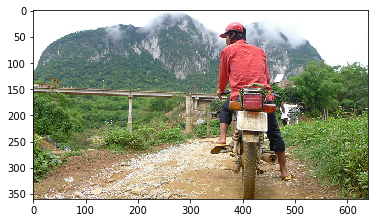

Category ids and  labels: 
1 ->  person
2 ->  bicycle
4 ->  motorcycle
<class 'torch.Tensor'>


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


torch.Size([1000])
Top 5
Predictions =  assault rifle, assault gun
Predictions =  stretcher
Predictions =  rifle
Predictions =  military uniform
Predictions =  jeep, landrover


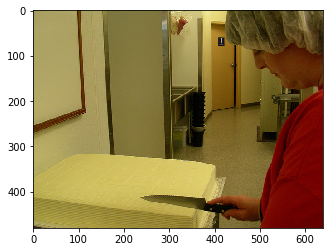

Category ids and  labels: 
81 ->  sink
1 ->  person
61 ->  cake
49 ->  knife
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  mosquito net
Predictions =  toilet tissue, toilet paper, bathroom tissue
Predictions =  wardrobe, closet, press
Predictions =  washbasin, handbasin, washbowl, lavabo, wash-hand basin
Predictions =  medicine chest, medicine cabinet


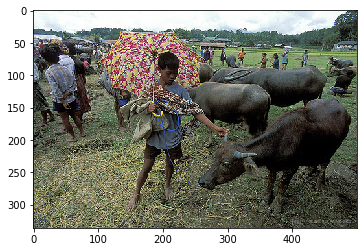

Category ids and  labels: 
1 ->  person
28 ->  umbrella
21 ->  cow
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  Arabian camel, dromedary, Camelus dromedarius
Predictions =  sandbar, sand bar
Predictions =  Italian greyhound
Predictions =  Weimaraner
Predictions =  swimming trunks, bathing trunks


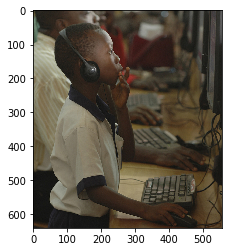

Category ids and  labels: 
72 ->  tv
1 ->  person
74 ->  mouse
76 ->  keyboard
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  plastic bag
Predictions =  lab coat, laboratory coat
Predictions =  toilet tissue, toilet paper, bathroom tissue
Predictions =  bonnet, poke bonnet
Predictions =  gasmask, respirator, gas helmet


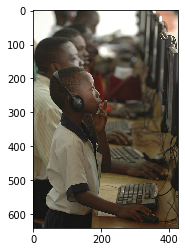

Category ids and  labels: 
72 ->  tv
1 ->  person
74 ->  mouse
76 ->  keyboard
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  plastic bag
Predictions =  groom, bridegroom
Predictions =  gasmask, respirator, gas helmet
Predictions =  toilet tissue, toilet paper, bathroom tissue
Predictions =  mosquito net


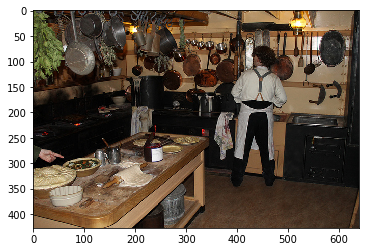

Category ids and  labels: 
1 ->  person
67 ->  dining table
44 ->  bottle
79 ->  oven
47 ->  cup
49 ->  knife
50 ->  spoon
51 ->  bowl
81 ->  sink
56 ->  broccoli
57 ->  carrot
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  dining table, board
Predictions =  grand piano, grand
Predictions =  mosquito net
Predictions =  restaurant, eating house, eating place, eatery
Predictions =  desk


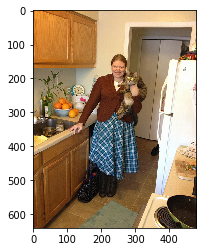

Category ids and  labels: 
64 ->  potted plant
1 ->  person
44 ->  bottle
79 ->  oven
17 ->  cat
82 ->  refrigerator
50 ->  spoon
51 ->  bowl
85 ->  clock
81 ->  sink
55 ->  orange
31 ->  handbag
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  bath towel
Predictions =  dishwasher, dish washer, dishwashing machine
Predictions =  shower cap
Predictions =  bassinet
Predictions =  hand blower, blow dryer, blow drier, hair dryer, hair drier


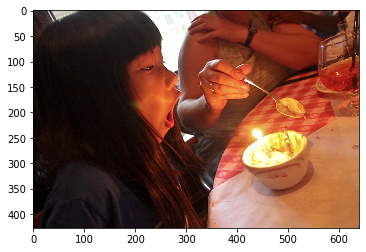

Category ids and  labels: 
1 ->  person
67 ->  dining table
46 ->  wine glass
50 ->  spoon
51 ->  bowl
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  Petri dish
Predictions =  bubble
Predictions =  groom, bridegroom
Predictions =  tub, vat
Predictions =  candle, taper, wax light


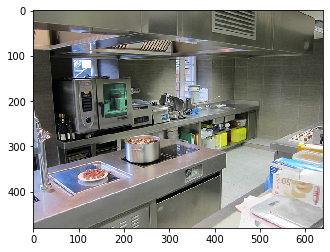

Category ids and  labels: 
81 ->  sink
51 ->  bowl
44 ->  bottle
79 ->  oven
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  photocopier
Predictions =  refrigerator, icebox
Predictions =  medicine chest, medicine cabinet
Predictions =  microwave, microwave oven
Predictions =  dishwasher, dish washer, dishwashing machine


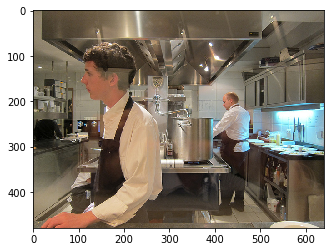

Category ids and  labels: 
1 ->  person
44 ->  bottle
47 ->  cup
49 ->  knife
51 ->  bowl
27 ->  backpack
<class 'torch.Tensor'>
torch.Size([1000])
Top 5
Predictions =  lab coat, laboratory coat
Predictions =  mosquito net
Predictions =  hoopskirt, crinoline
Predictions =  pajama, pyjama, pj's, jammies
Predictions =  beaker


In [16]:
softmax = nn.Softmax()
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
for image_id in val_ids[:10]:
    # Display the image.
    # -- Your code goes here --
    img = val_id_to_file[image_id]
    #print (image_id)
    img = mpimg.imread(img)
    plt.imshow(img)
    plt.show()
    
    # Print all of the category labels for this image.
    # -- Your code goes here --
    print ("Category ids and  labels: ")
    category_labels = val_id_to_categories[image_id]
    #category_to_names
    for id in category_labels:
      print (id, "-> ", category_to_name[id])
  
    # Load/preprocess the image.
    img = load_image(val_id_to_file[image_id])
    print (type(img))
    # Run the image through the model and softmax.
    label_likelihoods = softmax(vgg_model(img)).squeeze()
    print (label_likelihoods.shape)
    # Get the top 5 labels, and their corresponding likelihoods.
    print ("Top 5")
    probs, indices = label_likelihoods.topk(5)
    indices = indices.cpu()
    indices = indices.detach().numpy()
    # Iterate and print out the predictions.
    # -- Your code goes here --
    for id in indices:
      print ("Predictions = ", imagenet_categories[id])



In [41]:
print (probs)

tensor([0.4805, 0.2050, 0.0272, 0.0247, 0.0231], grad_fn=<TopkBackward>)


# 3. Computing Generic Visual Features using CNN

Since, rather than the output of VGG, we want a fixed sized vector representation of each image, we remove the last linear layer. The implementation of the forward function for VGG is shown below:

```
x = self.features(x)
x = x.view(x.size(0), -1) #x.view is to reshape
x = self.classifier(x)
```
We aim to preserve everything but the final component of the classifier, meaning we must define an alternative equivalent to `self.classifier`.

In [17]:
# Remove the final layer of the classifier, and indicate to PyTorch that the model is being used for inference
# rather than training (most importantly, this disables dropout).

# -- Your code goes here --
print (vgg_model.classifier)
original_in_features = vgg_model.classifier[6].in_features
original_out_features = vgg_model.classifier[6].out_features
for i in range (0,7):
    print (i,vgg_model.classifier[i])
    
vgg_model.classifier = nn.Sequential(*[vgg_model.classifier[i] for i in range(5)])
# to remove dropout, we need to add 
vgg_model.eval()
print (vgg_model.classifier)

Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
  (5): Dropout(p=0.5, inplace=False)
  (6): Linear(in_features=4096, out_features=1000, bias=True)
)
0 Linear(in_features=25088, out_features=4096, bias=True)
1 ReLU(inplace=True)
2 Dropout(p=0.5, inplace=False)
3 Linear(in_features=4096, out_features=4096, bias=True)
4 ReLU(inplace=True)
5 Dropout(p=0.5, inplace=False)
6 Linear(in_features=4096, out_features=1000, bias=True)
Sequential(
  (0): Linear(in_features=25088, out_features=4096, bias=True)
  (1): ReLU(inplace=True)
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=4096, out_features=4096, bias=True)
  (4): ReLU(inplace=True)
)


In [19]:
# First we vectorize all of the features of training images and write the results to a file.

# -- Your code goes here --
import numpy as np
# -- Your code goes here --
print (len(train_ids))
training_vectors = np.zeros((len(train_ids),4096))
for index, image_id in enumerate(train_ids) :
    img = load_image(train_id_to_file[image_id])
    features  = vgg_model(img)
    training_vectors[index] = features.detach().numpy()
    if index%100 == 0:
      print ("Images done:", index)

    
np.save(open('/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/outputs/training_vectors', 'wb+'), training_vectors)
print (training_vectors.shape)

    
#np.save(open('/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/outputs/training_vectors', 'wb+'), training_vectors)

20000
Images done: 0
Images done: 100
Images done: 200
Images done: 300
Images done: 400
Images done: 500
Images done: 600
Images done: 700
Images done: 800
Images done: 900
Images done: 1000
Images done: 1100
Images done: 1200
Images done: 1300
Images done: 1400
Images done: 1500
Images done: 1600
Images done: 1700
Images done: 1800
Images done: 1900
Images done: 2000
Images done: 2100
Images done: 2200
Images done: 2300
Images done: 2400
Images done: 2500
Images done: 2600
Images done: 2700
Images done: 2800
Images done: 2900
Images done: 3000
Images done: 3100
Images done: 3200
Images done: 3300
Images done: 3400
Images done: 3500
Images done: 3600
Images done: 3700
Images done: 3800
Images done: 3900
Images done: 4000
Images done: 4100
Images done: 4200
Images done: 4300
Images done: 4400
Images done: 4500
Images done: 4600
Images done: 4700
Images done: 4800
Images done: 4900
Images done: 5000
Images done: 5100
Images done: 5200
Images done: 5300
Images done: 5400
Images done: 550

In [22]:
# First we vectorize all of the features of training images and write the results to a file.

# -- Your code goes here --
import numpy as np
# -- Your code goes here --
print (len(val_ids))
validation_vectors = np.zeros((len(val_ids),4096))
for index, image_id in enumerate(val_ids) :
    img = load_image(val_id_to_file[image_id])
    features  = vgg_model(img)
    validation_vectors[index] = features.detach().numpy()

    
np.save(open('/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/outputs/validation_vectors', 'wb+'), validation_vectors)
print (validation_vectors.shape)

    
#np.save(open('/Users/garimaaggarwal/Documents/CPSC532S/Week2/data_sampled/outputs/training_vectors', 'wb+'), training_vectors)

100
(100, 4096)


# 4. Visual Similarity

We now use the generated vectors, to find the closest training image for each validation image. This can easily be done by finding the training vector that minimizes the Euclidean distance for every validation image. We repeat this exercise for the first 10 images in the validation set.

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(20000, 4096)


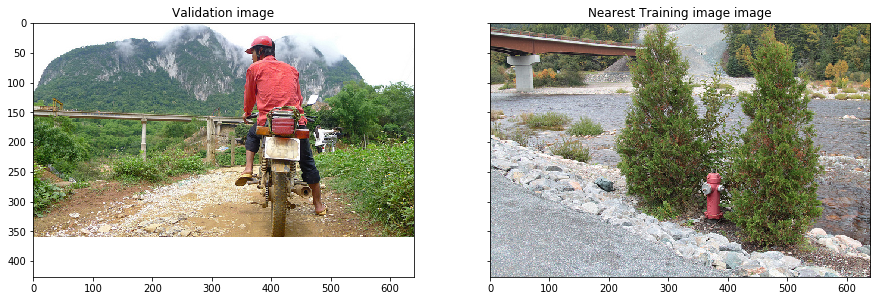

-------------------------------


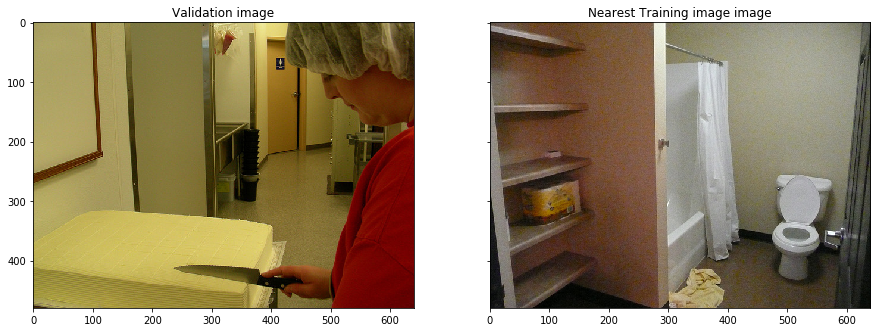

-------------------------------


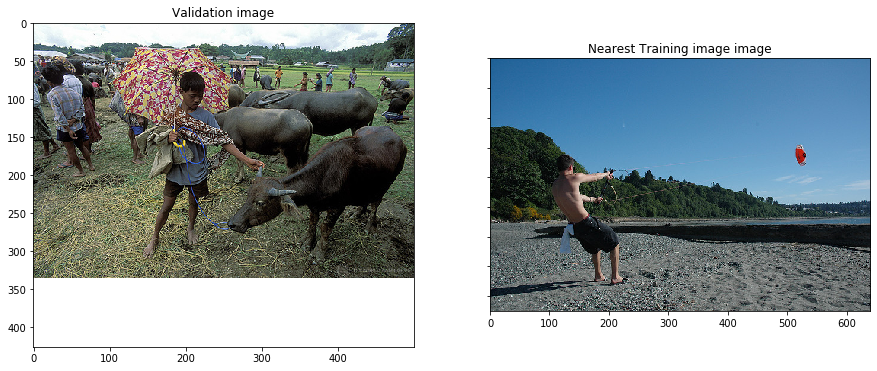

-------------------------------


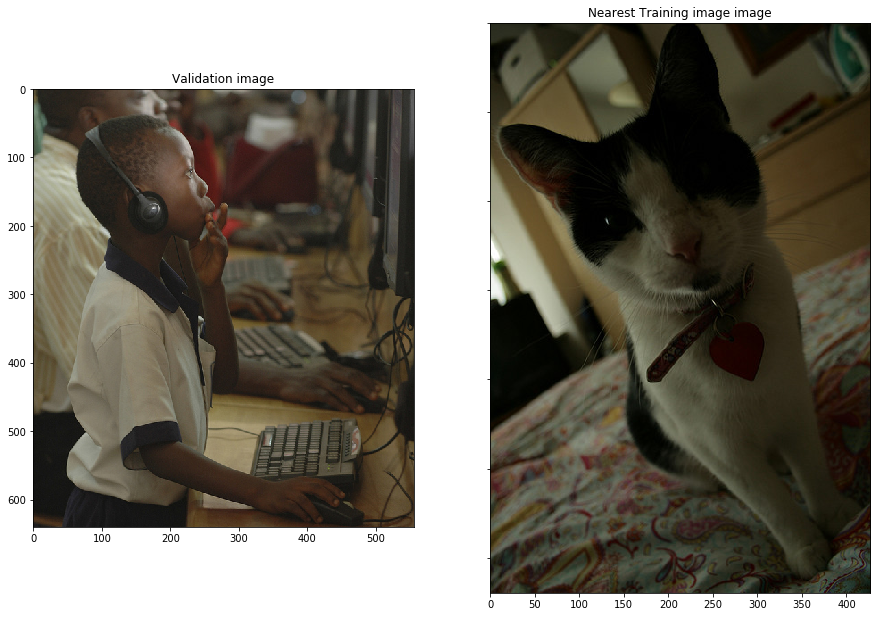

-------------------------------


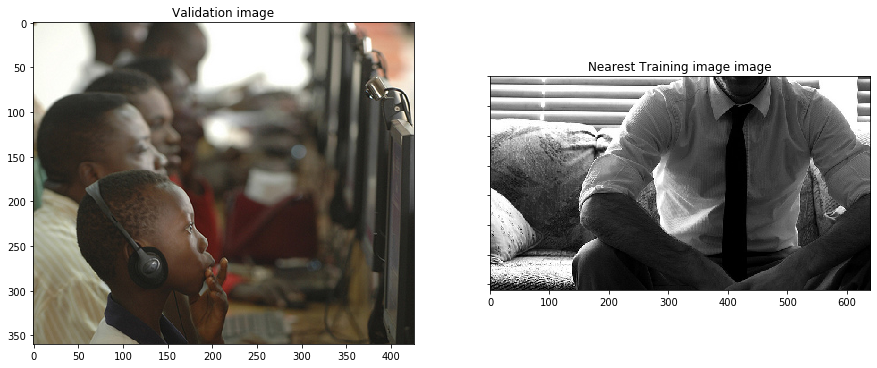

-------------------------------


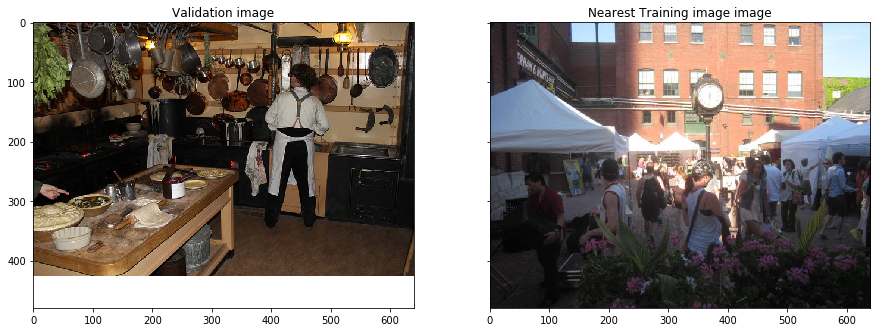

-------------------------------


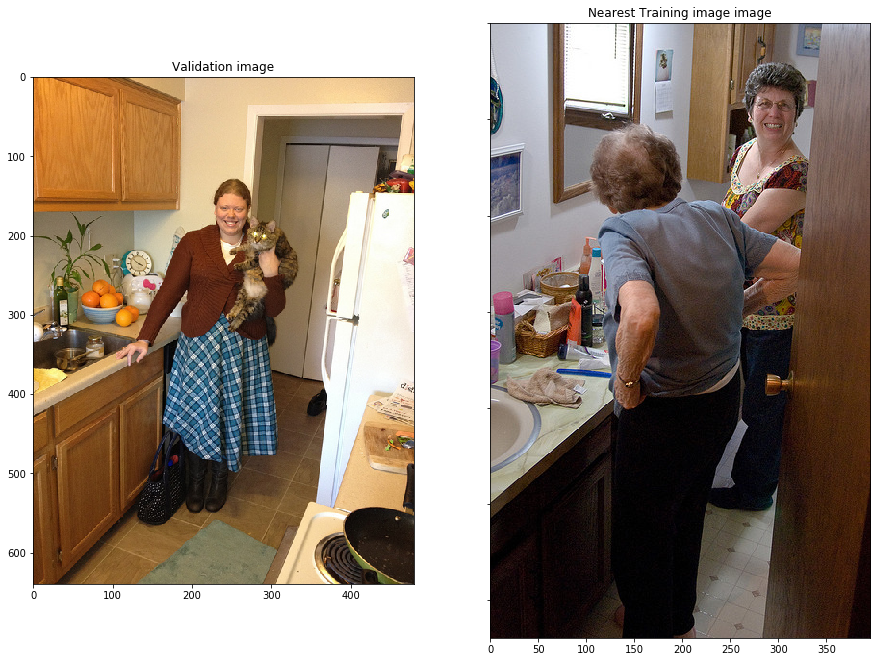

-------------------------------


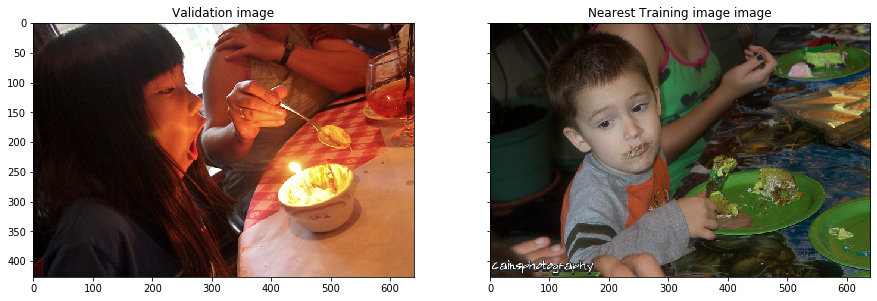

-------------------------------


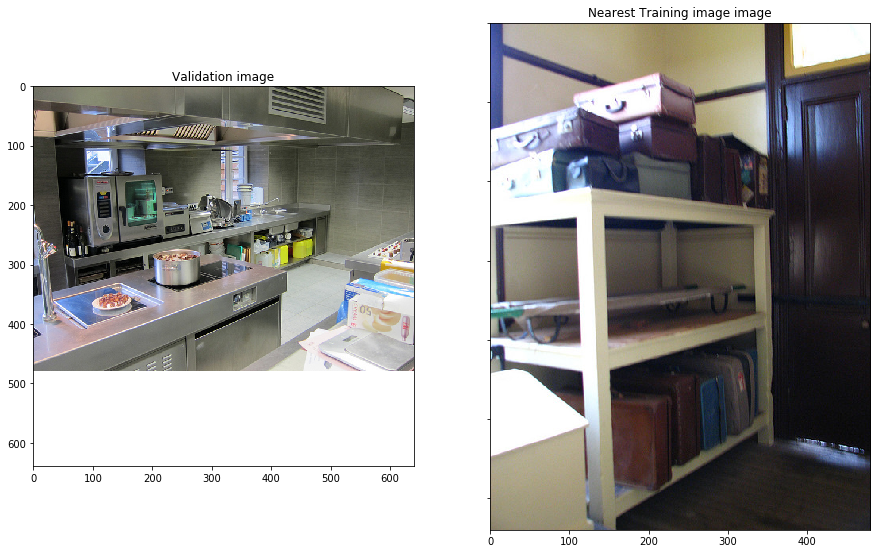

-------------------------------


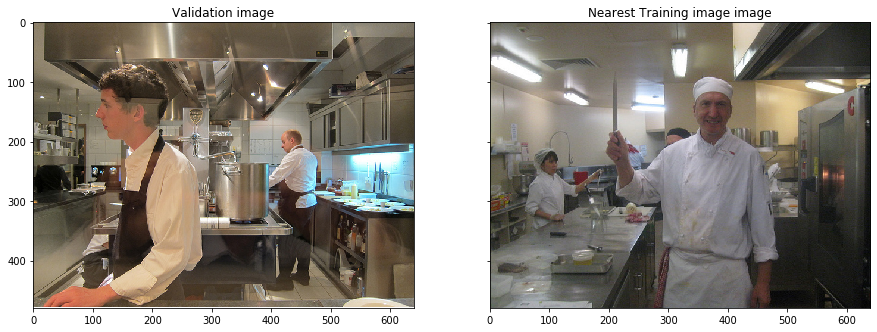

-------------------------------


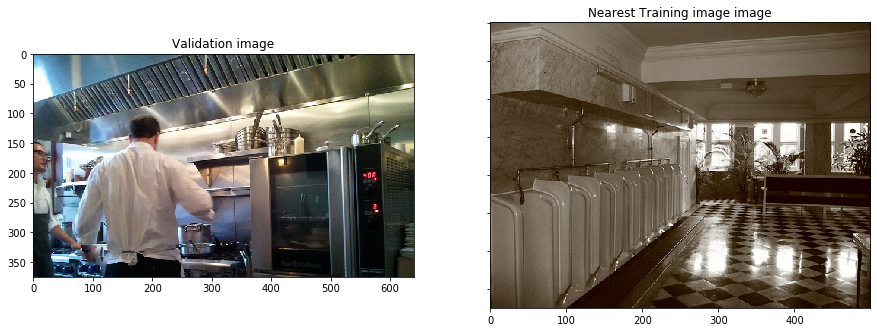

-------------------------------


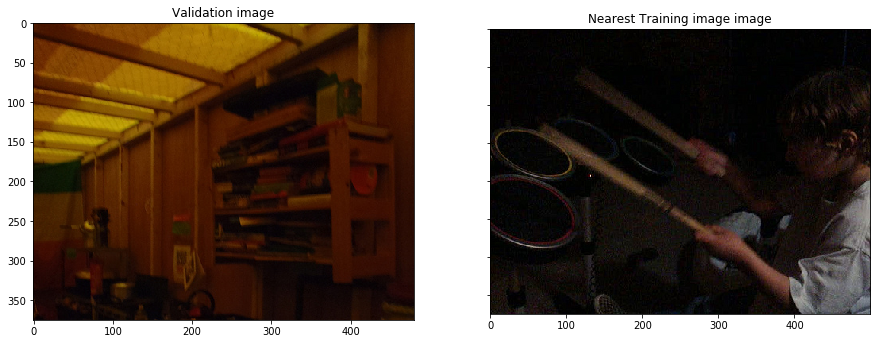

-------------------------------


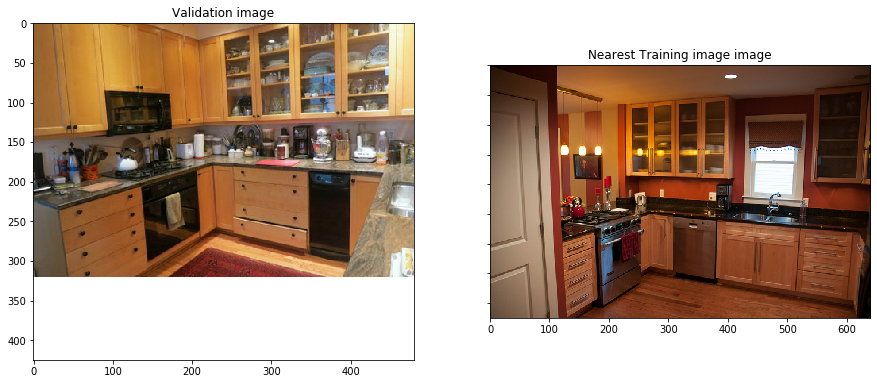

-------------------------------


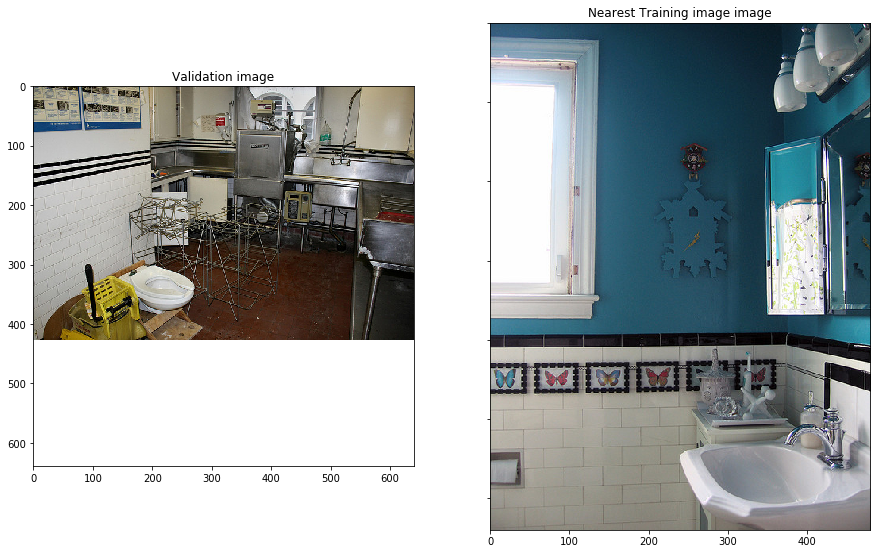

-------------------------------


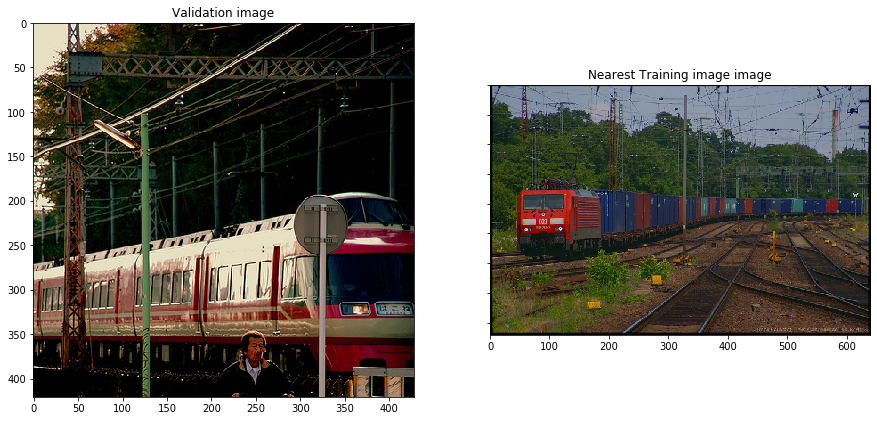

-------------------------------


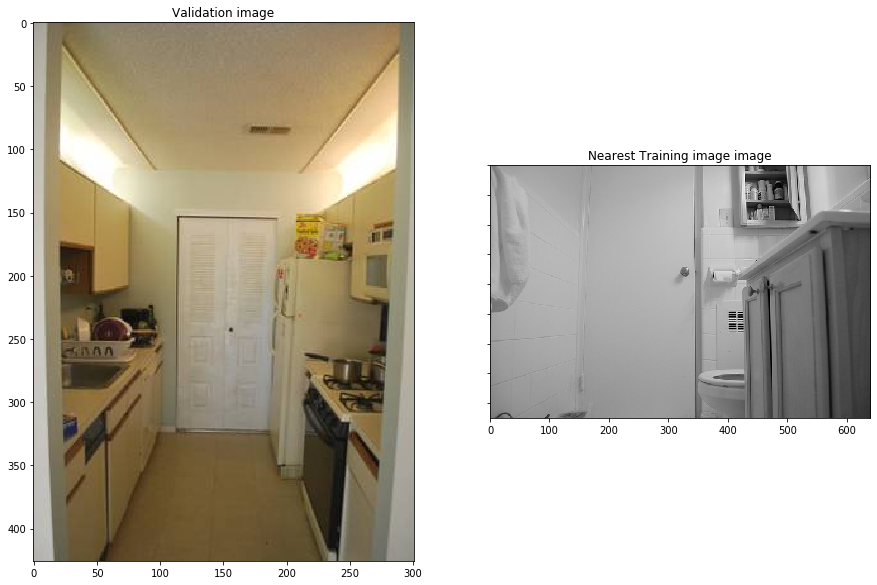

-------------------------------


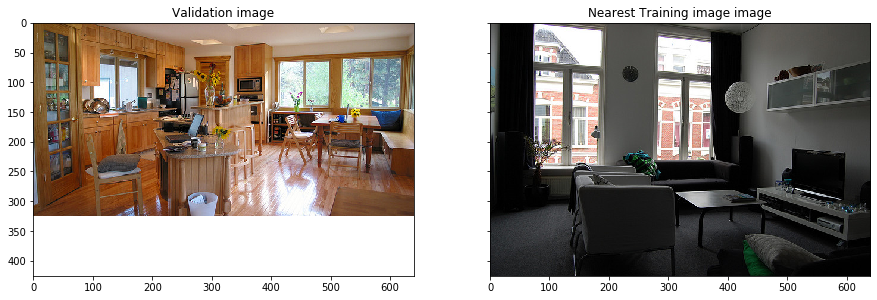

-------------------------------


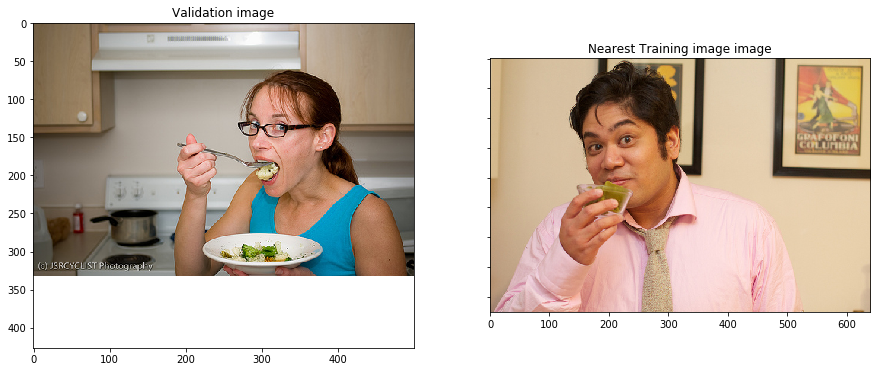

-------------------------------


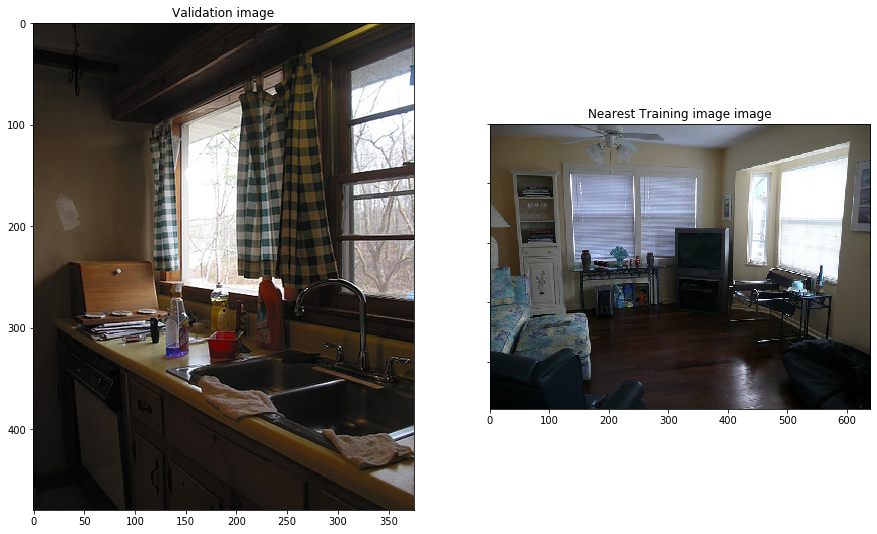

-------------------------------


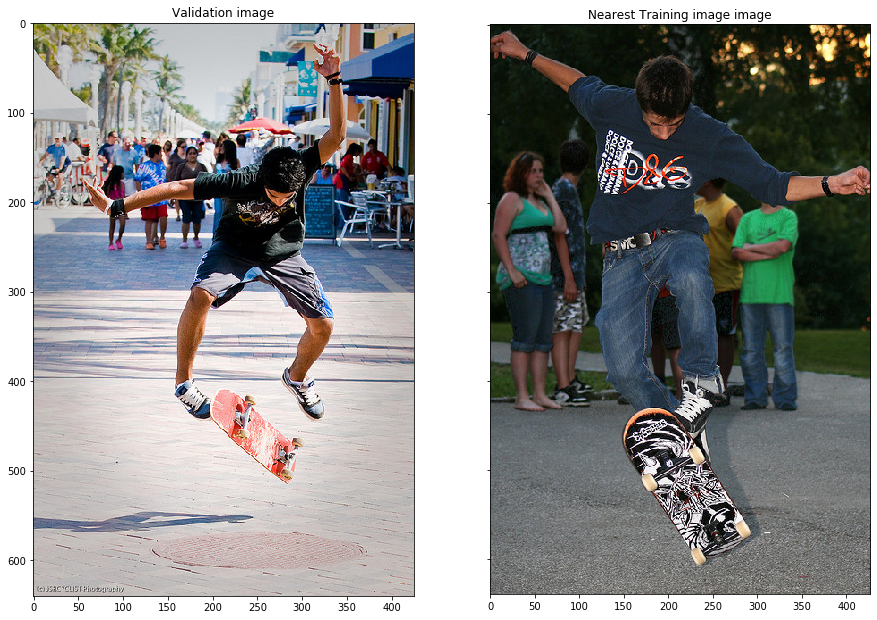

-------------------------------


In [165]:
# -- Your code goes here --
# -- Your code goes here --
print (type(validation_vectors))
print (type(training_vectors))
print (training_vectors.shape)
for index, image_id in enumerate(val_ids[:20]):
  eucledian_distances = []
  for index_train, train_image_id in enumerate(train_ids):
    feature_vector_valid = validation_vectors[index]
    feature_vector_train = training_vectors[index_train]
    edistance = np.linalg.norm(feature_vector_train-feature_vector_valid)
    eucledian_distances.append(edistance)
  min_index = np.argmin(eucledian_distances)
  train_image_id = train_ids[min_index]
  train_img = train_id_to_file[train_image_id]
  #print ("Validation Image: ")
  img = val_id_to_file[image_id]
  #print (feature_vector_valid)
  #print (image_id)
  img = mpimg.imread(img)
  #plt.imshow(img)
  #plt.show()
  #print ("Nearest training image")
  train_img = mpimg.imread(train_img)
  #plt.imshow(train_img)
  plt.show()
  #print("-----------------------------")
  f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
  ax1.imshow(img)
  ax1.set_title('Validation image')
  ax2.imshow(train_img)
  ax2.set_title('Nearest Training image image')
  plt.show()
  print("-------------------------------")


In [29]:
feature_vector_valid_copy = validation_vectors
feature_vector_train_copy = training_vectors
print (type(feature_vector_valid_copy), feature_vector_valid_copy.shape)

<class 'numpy.ndarray'> (100, 4096)


# 5. Training a Multi-Label Classification Network

We now build a two layer classification network, which takes 4096-dimensional vectors as input and outputs the probabilities of the 80 categories present in MSCOCO. 

For this purpose, we utilize two layers (both containing sigmoid activation functions) with the hidden dimension set to 512. 

In [235]:
# Data Pipeline - self code
X = training_vectors
#X = torch.tensor(X)
print (type(training_vectors))
print (type(X))
print (X.shape)

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(20000, 4096)


In [236]:
#one hot encoding
Y = np.zeros([20000, 80])
print(Y[0])
# get category from train_id_to_category - map it to the index, then output it's label
for index, image_id in enumerate(train_ids):
    for id in train_id_to_categories[train_ids[index]]:
        output_index = category_to_idx[id]
        #print (index, id)
        Y[index][output_index] = 1
Y = np.array(Y)     
print (Y.shape)
print (Y[0])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
(20000, 80)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 1. 0. 0. 0. 0.]


In [237]:
print (Y.shape)
print (type(Y))

(20000, 80)
<class 'numpy.ndarray'>


In [521]:
# custom dataset - we have our feature vectors, now converting them to a Dataset
class imageDataset(Dataset):
    def __init__(self, X, Y):
        self.n_samples = X.shape[0]
        self.x = torch.from_numpy(X)
        self.y = torch.from_numpy(Y)
        
    
    def __getitem__(self, index):
        return self.x[index], self.y[index]
        
    def __len__(self):
        return self.n_samples
        

In [240]:
# First we construct a class for the model
# -- Your code goes here --
class NeuralNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(NeuralNet, self).__init__()
        self.l1 = nn.Linear(input_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
        self.l2 = nn.Linear(hidden_size, num_classes)
    def forward(self, x):
        out = self.l1(x)
        out = self.sigmoid(out)
        out = self.l2(out)
        return out

In [273]:
n_inputs = 4096
n_hidden = 512
n_outputs = 80
model = NeuralNet(n_inputs, n_hidden, n_outputs)
learning_rate=0.001
# loss and optimizer
criterion = nn.MultiLabelSoftMarginLoss()
optimizer = torch.optim.SGD(model.parameters(), lr = learning_rate )

In [ ]:
dataset = imageDataset(X,Y)
dataloader_train = DataLoader(dataset = dataset, batch_size = 100, shuffle = True)
dataiter = iter(dataloader_train)

In [281]:
# The output data is prepared by representing each output as a binary vector of categories
# -- Your code goes here --
def train(model, learning_rate=0.001, batch_size=100, epochs=5):
    """
    Training function which takes as input a model, a learning rate and a batch size.
  
    After completing a full pass over the data, the function exists, and the input model will be trained.
    """
    # -- Your code goes here --
    for i in range(0,epochs):
        model.train()
        for b_index, (featueres, labels) in enumerate(dataloader_train):
            #print (features.shape)
            #print (b_index)
            outputs = model(features)
            loss = criterion(outputs,labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        
            if(b_index)%50 == 0:
                print (f'epoch {i+1}/{epochs} Batch {b_index+1} loss {loss}')



20000


In [337]:
# Finally train the model
#features, labels = dataset[1]
#print (type(dataset[1]))
model = model.double()
train(model)

epoch 1/5 Batch 1 loss 0.3227399269318613
epoch 1/5 Batch 51 loss 0.3145346238341757
epoch 1/5 Batch 101 loss 0.31410522530517254
epoch 1/5 Batch 151 loss 0.30998186200527467
epoch 2/5 Batch 1 loss 0.3006498209679335
epoch 2/5 Batch 51 loss 0.29383344679647355
epoch 2/5 Batch 101 loss 0.29330342326638975
epoch 2/5 Batch 151 loss 0.291221597565533
epoch 3/5 Batch 1 loss 0.29238733269089756
epoch 3/5 Batch 51 loss 0.28289370270558906
epoch 3/5 Batch 101 loss 0.2825100627615308
epoch 3/5 Batch 151 loss 0.2765278927009793
epoch 4/5 Batch 1 loss 0.2707007491907742
epoch 4/5 Batch 51 loss 0.27622665870981783
epoch 4/5 Batch 101 loss 0.26968565666088984
epoch 4/5 Batch 151 loss 0.2633065762639046
epoch 5/5 Batch 1 loss 0.2645867097850149
epoch 5/5 Batch 51 loss 0.2605576721857303
epoch 5/5 Batch 101 loss 0.26158992446122875
epoch 5/5 Batch 151 loss 0.25206223195116684


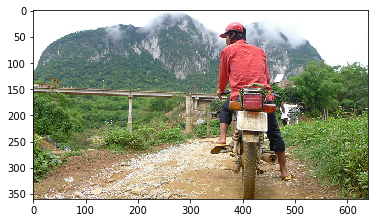

Category ids and  labels: 
1 ->  person
2 ->  bicycle
4 ->  motorcycle
Predicted categories:
['person', 'dining table', 'laptop', 'refrigerator', 'bowl']


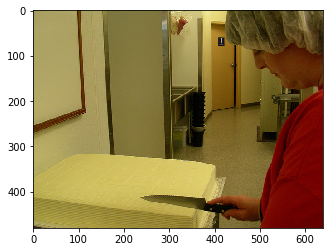

Category ids and  labels: 
81 ->  sink
1 ->  person
61 ->  cake
49 ->  knife
Predicted categories:
['person', 'dining table', 'laptop', 'bowl', 'scissors']


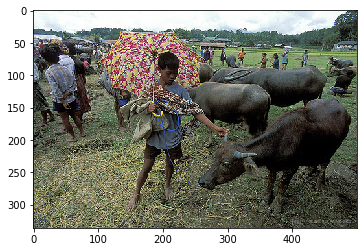

Category ids and  labels: 
1 ->  person
28 ->  umbrella
21 ->  cow
Predicted categories:
['person', 'dining table', 'laptop', 'refrigerator', 'car']


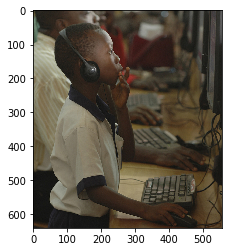

Category ids and  labels: 
72 ->  tv
1 ->  person
74 ->  mouse
76 ->  keyboard
Predicted categories:
['person', 'dining table', 'laptop', 'scissors', 'bowl']


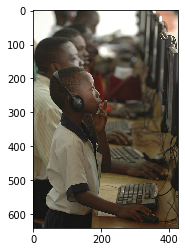

Category ids and  labels: 
72 ->  tv
1 ->  person
74 ->  mouse
76 ->  keyboard
Predicted categories:
['person', 'dining table', 'laptop', 'scissors', 'refrigerator']


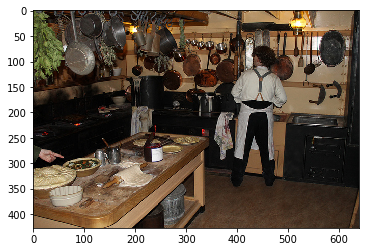

Category ids and  labels: 
1 ->  person
67 ->  dining table
44 ->  bottle
79 ->  oven
47 ->  cup
49 ->  knife
50 ->  spoon
51 ->  bowl
81 ->  sink
56 ->  broccoli
57 ->  carrot
Predicted categories:
['person', 'dining table', 'laptop', 'scissors', 'car']


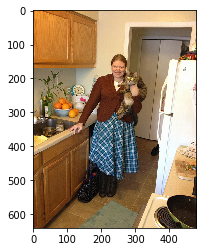

Category ids and  labels: 
64 ->  potted plant
1 ->  person
44 ->  bottle
79 ->  oven
17 ->  cat
82 ->  refrigerator
50 ->  spoon
51 ->  bowl
85 ->  clock
81 ->  sink
55 ->  orange
31 ->  handbag
Predicted categories:
['person', 'dining table', 'laptop', 'suitcase', 'cat']


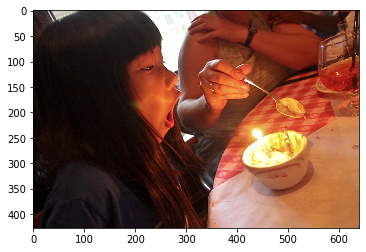

Category ids and  labels: 
1 ->  person
67 ->  dining table
46 ->  wine glass
50 ->  spoon
51 ->  bowl
Predicted categories:
['person', 'dining table', 'scissors', 'laptop', 'car']


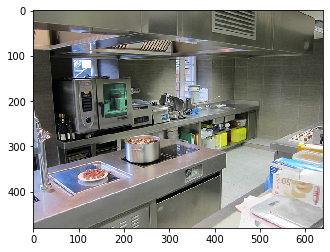

Category ids and  labels: 
81 ->  sink
51 ->  bowl
44 ->  bottle
79 ->  oven
Predicted categories:
['person', 'dining table', 'laptop', 'bowl', 'suitcase']


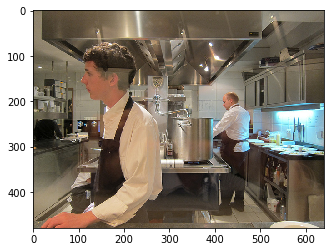

Category ids and  labels: 
1 ->  person
44 ->  bottle
47 ->  cup
49 ->  knife
51 ->  bowl
27 ->  backpack
Predicted categories:
['person', 'dining table', 'laptop', 'scissors', 'bowl']


In [291]:
# Now repeat step two using the two layer classifier.
# -- Your code goes here --
valid_set = torch.from_numpy(validation_vectors)
for index,image_id in enumerate(val_ids[:10]):
    # Display the image.
    # -- Your code goes here --
    img = val_id_to_file[image_id]
    #print (image_id)
    img = mpimg.imread(img)
    plt.imshow(img)
    plt.show()
    # Print all of the category labels for this image.
    # -- Your code goes here --
    print ("Category ids and  labels: ")
    category_labels = val_id_to_categories[image_id]
    #category_to_names
    for id in category_labels:
      print (id, "-> ", category_to_name[id])
    
    #Run the model
    output = model(valid_set[index])
    probs, indices = output.topk(5)
    #print (probs, indices)
    categories_name = []
    for i in indices:
        categories_name.append(category_idx_to_name[i])
    print ("Predicted categories:")
    print (categories_name)
    
    
    
  
    

I observed that the model is predicting categories upto a reasonable level, for example the category - person is seen in most labels as well as predictions. I think the performance could have been better if I used Relu instead of sigmoid, as used in the original VGG 16 model. However, I observed that the output categories from my model are almost same for all images. It may be due to insufficient training or a problem in the dataset.

In [ ]:
# This is a basic transfer learning structure that can be written for a centralized learning. 
# This code has been referenced form my code for CPSC 532s assignmnet at UBC.